In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
import math
import warnings
warnings.filterwarnings('ignore')

In [2]:
DATASET_PATH = '../dataset'

# Load all 16 CSV files and combine them
frames = []
for filename in os.listdir(DATASET_PATH):
    if filename.endswith('.csv'):
        filepath = os.path.join(DATASET_PATH, filename)
        df_temp = pd.read_csv(filepath, usecols=['movie_id', 'movie_name', 'description', 'genre'])
        frames.append(df_temp)

df = pd.concat(frames, ignore_index=True)
print(f'Total rows after combining: {df.shape[0]}')

# Drop rows missing description or genre
df = df.dropna(subset=['description', 'genre'])

# Remove duplicate movies (same movie appeared in multiple genre files)
df = df.drop_duplicates(subset=['movie_id'])
df = df.reset_index(drop=True)

# Fill missing movie names
df['movie_name'] = df['movie_name'].fillna('Unknown')

# Keep only rows where description has at least 10 words
df['word_count'] = df['description'].apply(lambda x: len(str(x).split()))
df = df[df['word_count'] >= 10].reset_index(drop=True)

print(f'After cleaning: {df.shape[0]} movies')
df.head(3)

Total rows after combining: 368300
After cleaning: 181735 movies


,movie_id,movie_name,genre,description,word_count
0,tt9114286,Black Panther: Wakanda Forever,"Action, Adventure, Drama",The people of Wakanda fight to protect their h...,21
1,tt1630029,Avatar: The Way of Water,"Action, Adventure, Fantasy",Jake Sully lives with his newfound family form...,40
2,tt5884796,Plane,"Action, Thriller",A pilot finds himself caught in a war zone aft...,21


In [3]:
# Check for duplicate movie_id values
# A movie can appear in multiple genre CSV files, so we verify deduplication worked
duplicate_ids = df[df.duplicated(subset=['movie_id'], keep=False)]

if duplicate_ids.empty:
    print('Good — all movie_id values are unique after deduplication.')
else:
    print(f'Found {len(duplicate_ids)} rows with duplicate movie_id values.')
    display(duplicate_ids.head(5))

Good — all movie_id values are unique after deduplication.


## Dataset Overview

- **Source:** IMDB Movies Dataset Based on Genre (Kaggle)
- **Files:** 16 CSV files, one per genre
- **After cleaning:** ~182k unique movies
- Each movie can belong to **multiple genres** â€” this is a **multi-label classification problem**.

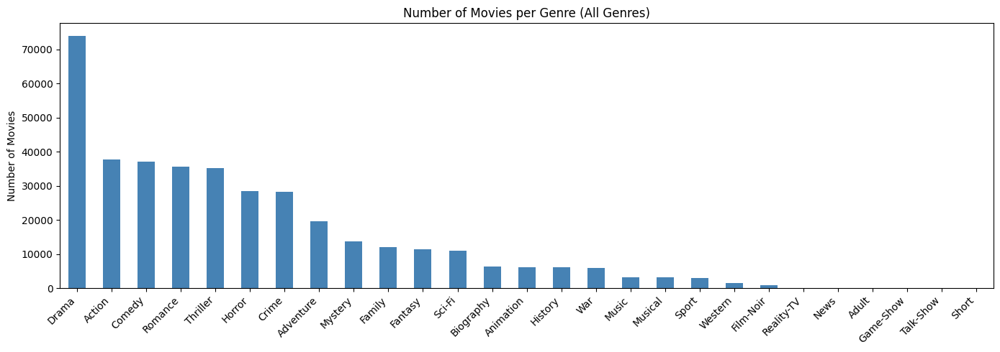

Drama         74018
Action        37851
Comedy        37156
Romance       35642
Thriller      35200
Horror        28597
Crime         28198
Adventure     19721
Mystery       13720
Family        11967
Fantasy       11438
Sci-Fi        10938
Biography      6373
Animation      6254
History        6111
War            5920
Music          3242
Musical        3137
Sport          2983
Western        1596
Film-Noir       867
Reality-TV       20
News             13
Adult             5
Game-Show         4
Talk-Show         3
Short             1
dtype: int64


In [4]:
# Split genre column (e.g. 'Action, Adventure') into a list per movie
df['genre_list'] = df['genre'].apply(lambda x: [g.strip() for g in x.split(',')])

# Count how many movies each genre appears in
genre_counts = {}
for genre_list in df['genre_list']:
    for genre in genre_list:
        if genre not in genre_counts:
            genre_counts[genre] = 0
        genre_counts[genre] += 1

genre_counts = pd.Series(genre_counts).sort_values(ascending=False)

plt.figure(figsize=(14, 5))
genre_counts.plot(kind='bar', color='steelblue')
plt.title('Number of Movies per Genre (All Genres)')
plt.ylabel('Number of Movies')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig('../genre_distribution_all.png', bbox_inches='tight')
plt.show()

print(genre_counts)

### Class Imbalance

Drama (74k) dominates while some genres like Adult (7 movies) and Game-Show (4 movies) have almost no data.
Genres with fewer than 1,000 movies will be dropped â€” not enough data to learn from them.

In [5]:
# Keep only genres that appear in at least 1000 movies
MIN_COUNT = 1000
valid_genres = []
for genre, count in genre_counts.items():
    if count >= MIN_COUNT:
        valid_genres.append(genre)

valid_genres = sorted(valid_genres)
print(f'Keeping {len(valid_genres)} genres:')
print(valid_genres)

# Remove genres from each movie's list that are not in valid_genres
df['genre_list'] = df['genre_list'].apply(lambda genres: [g for g in genres if g in valid_genres])

# Remove movies that have no valid genres left
df = df[df['genre_list'].apply(len) > 0].reset_index(drop=True)

# One-hot encode: one column per genre (1 = movie has that genre, 0 = does not)
for genre in valid_genres:
    df[genre] = df['genre_list'].apply(lambda genres: 1 if genre in genres else 0)

GENRE_COLS = valid_genres
print(f'\nFinal dataset: {df.shape[0]} movies, {len(GENRE_COLS)} genres')

Keeping 20 genres:
['Action', 'Adventure', 'Animation', 'Biography', 'Comedy', 'Crime', 'Drama', 'Family', 'Fantasy', 'History', 'Horror', 'Music', 'Musical', 'Mystery', 'Romance', 'Sci-Fi', 'Sport', 'Thriller', 'War', 'Western']

Final dataset: 181735 movies, 20 genres


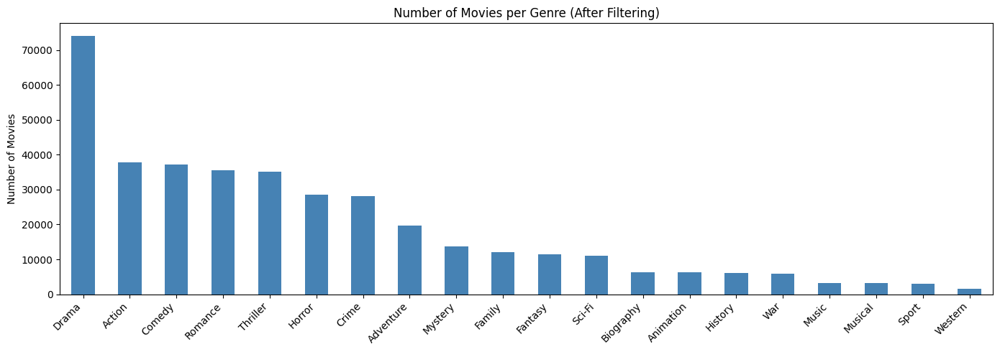

In [6]:
# Count movies per genre after filtering
genre_totals = df[GENRE_COLS].sum().sort_values(ascending=False)

plt.figure(figsize=(14, 5))
genre_totals.plot(kind='bar', color='steelblue')
plt.title('Number of Movies per Genre (After Filtering)')
plt.ylabel('Number of Movies')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

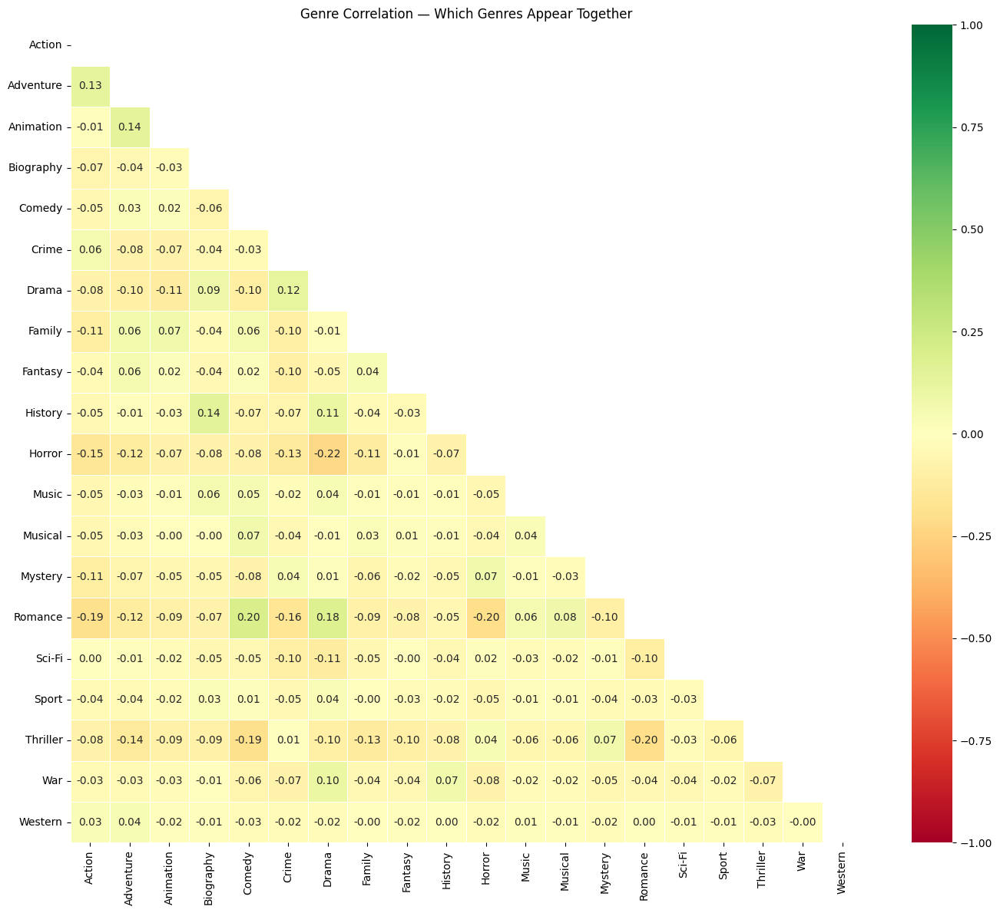

In [7]:
# Correlation between genre columns — high value means two genres often appear together
genre_corr = df[GENRE_COLS].corr()

# Mask the upper triangle so we only show the lower half (avoids redundant mirror)
mask = np.triu(np.ones_like(genre_corr, dtype=bool))

plt.figure(figsize=(14, 12))
sns.heatmap(genre_corr, mask=mask, annot=True, fmt='.2f', cmap='RdYlGn',
            vmin=-1, vmax=1, linewidths=0.5)
plt.title('Genre Correlation — Which Genres Appear Together')
plt.tight_layout()
plt.show()

### Genre Co-occurrence

Comedy and Romance are highly correlated they almost always appear together.
Drama is weakly correlated with most other genres because it is so common.
This confirms that multi-label classification is the right approach.

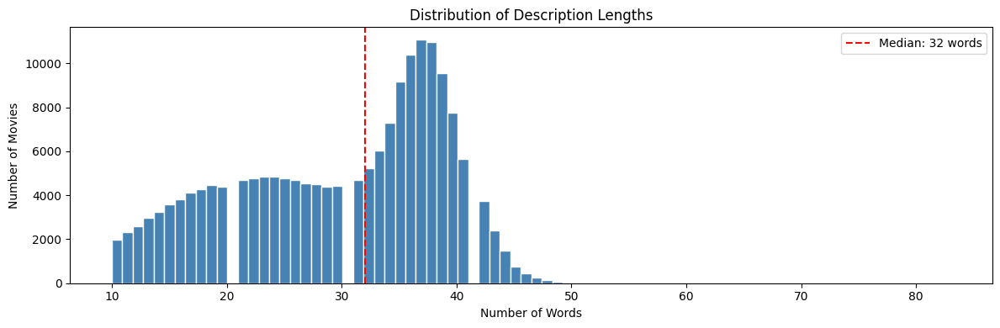

count    181735.000000
mean         29.690962
std           9.270241
min          10.000000
25%          22.000000
50%          32.000000
75%          37.000000
max          83.000000
Name: desc_len, dtype: float64


In [8]:
# Count words in each description
df['desc_len'] = df['description'].apply(lambda x: len(str(x).split()))

median_len = df['desc_len'].median()

plt.figure(figsize=(12, 4))
plt.hist(df['desc_len'], bins=80, color='steelblue', edgecolor='white')
plt.axvline(median_len, color='red', linestyle='--', label=f'Median: {median_len:.0f} words')
plt.title('Distribution of Description Lengths')
plt.xlabel('Number of Words')
plt.ylabel('Number of Movies')
plt.legend()
plt.tight_layout()
plt.show()

print(df['desc_len'].describe())

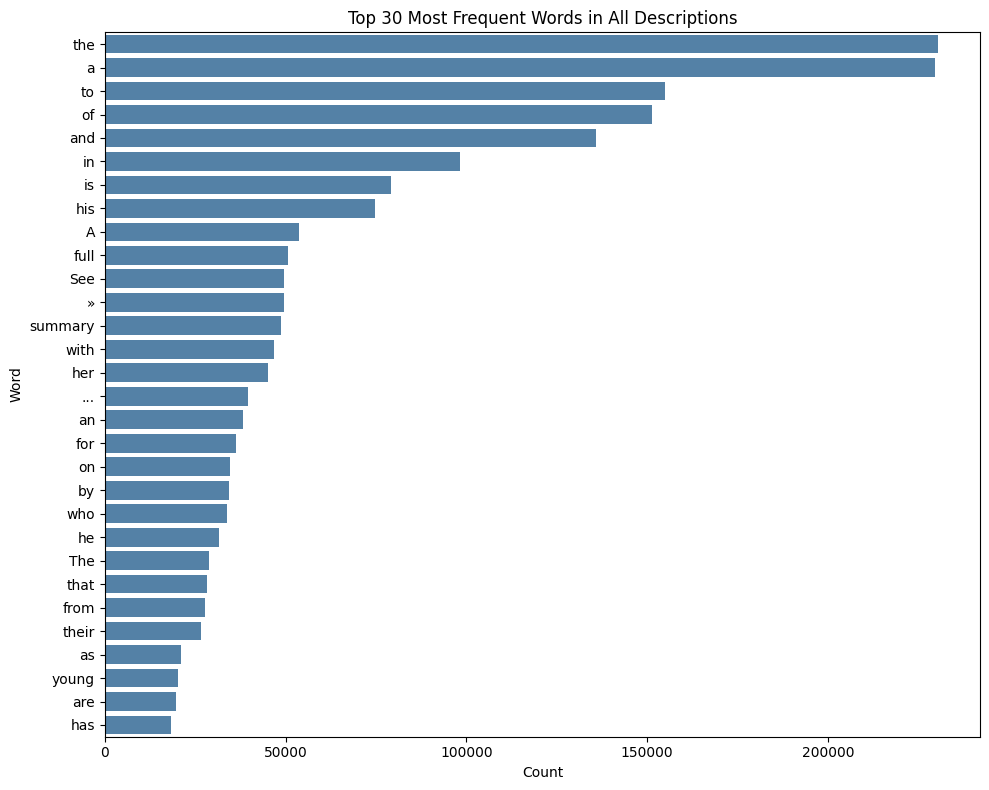

In [9]:
# Top 100 most frequent words across all descriptions (after preprocessing)
# This helps us see what words dominate and motivates the stopword removal
import nltk
from nltk.probability import FreqDist

# Join all descriptions into one big string and split into words
all_words = ' '.join(df['description'].dropna()).split()

# Count word frequencies
fdist = FreqDist(all_words)
words_df = pd.DataFrame({'word': list(fdist.keys()), 'count': list(fdist.values())})

# Get top 30 most frequent words
top_words = words_df.nlargest(30, columns='count')

plt.figure(figsize=(10, 8))
sns.barplot(data=top_words, x='count', y='word', color='steelblue')
plt.title('Top 30 Most Frequent Words in All Descriptions')
plt.xlabel('Count')
plt.ylabel('Word')
plt.tight_layout()
plt.show()

### Observation

Words like *man*, *woman*, *story*, *life*, *find* appear in almost every movie description regardless of genre. These carry no genre signal and will pollute the word clouds. The next cells show the word clouds before and after removing them.

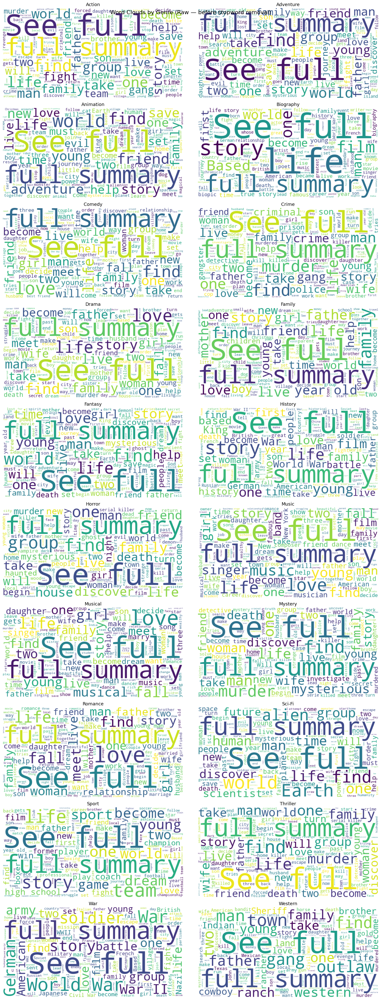

In [10]:
# Word cloud for each genre using raw descriptions
# Note: common words like 'man', 'woman', 'film', 'life' appear in every genre
# and dominate the cloud — we will fix this in the next cell
num_cols = 2
num_rows = math.ceil(len(GENRE_COLS) / num_cols)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, num_rows * 4))
axes = axes.flatten()

for i, genre in enumerate(GENRE_COLS):
    genre_descriptions = df[df[genre] == 1]['description'].dropna()
    all_text = ' '.join(genre_descriptions)
    wc = WordCloud(width=600, height=300, background_color='white').generate(all_text)
    axes[i].imshow(wc)
    axes[i].axis('off')
    axes[i].set_title(genre, fontsize=13)

for i in range(len(GENRE_COLS), len(axes)):
    axes[i].axis('off')

plt.suptitle('Word Clouds by Genre (Raw — before stopword removal)', fontsize=16)
plt.tight_layout()
plt.show()

### Observation

The raw word clouds are polluted by words like *man*, *woman*, *life*, *story*, *film* that appear in every genre and carry no genre-specific signal.
Below we remove these common movie description words to get a cleaner view of what makes each genre unique.

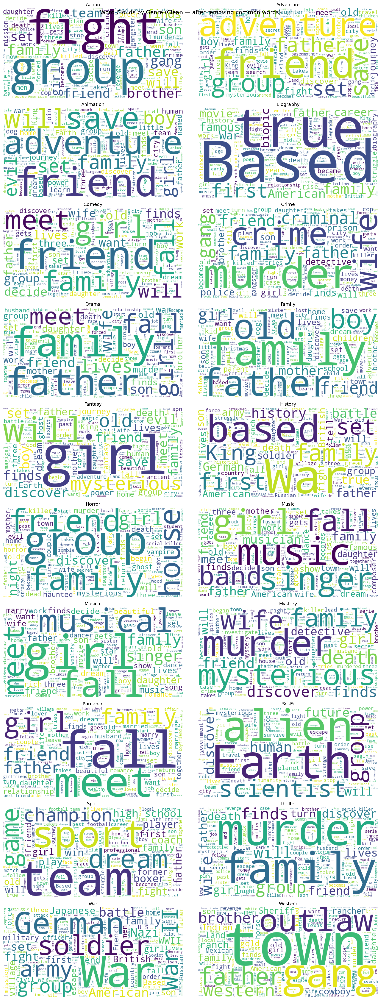

In [11]:
# Words that appear in almost every movie description regardless of genre
# Removing them makes the word cloud more informative
common_movie_words = [
    'man', 'woman', 'life', 'story', 'film', 'one', 'two', 'find', 'young',
    'love', 'become', 'live', 'see', 'full', 'summary', 'plot', 'add',
    'new', 'get', 'take', 'make', 'come', 'go', 'know', 'time', 'day',
    'way', 'year', 'back', 'world', 'people', 'help', 'must', 'try'
]

# WordCloud has a stopwords parameter — we add our custom words to the default set
from wordcloud import STOPWORDS
custom_stopwords = STOPWORDS.union(set(common_movie_words))

fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, num_rows * 4))
axes = axes.flatten()

for i, genre in enumerate(GENRE_COLS):
    genre_descriptions = df[df[genre] == 1]['description'].dropna()
    all_text = ' '.join(genre_descriptions)
    wc = WordCloud(width=600, height=300, background_color='white',
                   stopwords=custom_stopwords).generate(all_text)
    axes[i].imshow(wc)
    axes[i].axis('off')
    axes[i].set_title(genre, fontsize=13)

for i in range(len(GENRE_COLS), len(axes)):
    axes[i].axis('off')

plt.suptitle('Word Clouds by Genre (Clean — after removing common words)', fontsize=16)
plt.tight_layout()
plt.show()

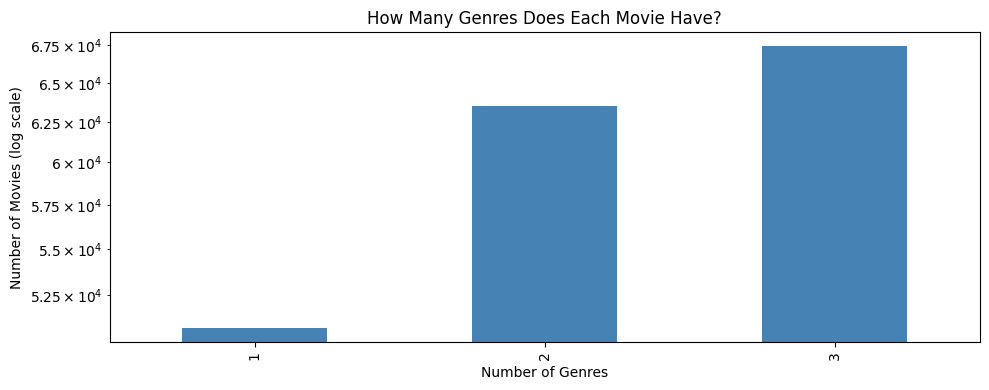

num_genres
1    50824
2    63495
3    67416
Name: count, dtype: int64


In [12]:
# How many genres does each movie have?
df['num_genres'] = df[GENRE_COLS].sum(axis=1)

genre_count_dist = df['num_genres'].value_counts().sort_index()

plt.figure(figsize=(10, 4))
genre_count_dist.plot(kind='bar', color='steelblue')
plt.title('How Many Genres Does Each Movie Have?')
plt.xlabel('Number of Genres')
plt.ylabel('Number of Movies (log scale)')
plt.yscale('log')
plt.tight_layout()
plt.show()

print(df['num_genres'].value_counts().sort_index())

## EDA Summary

| Finding | Implication |
|---|---|
| 20 genres kept, 7 dropped (too rare) | Clean label space, no noise labels |
| Drama in ~40% of all movies | Class imbalance â€” need balanced training |
| Action + Adventure strongly correlated | Multi-label setup is well-motivated |
| Median description ~30 words | Fits well within transformer token limits |
| Most movies have 1-3 genres | Prediction threshold of 0.3-0.5 is reasonable |

**Next step:** [02_baseline_classical_ml.ipynb](02_baseline_classical_ml.ipynb)